In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, InputLayer
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint

In [2]:

# Paths to the dataset
image_dir = "/kaggle/input/semantic-segmentation-of-underwater-imagery-suim/train_val/images"
mask_dir = "/kaggle/input/semantic-segmentation-of-underwater-imagery-suim/train_val/masks"

# Image size (resize all images to this size)
IMG_HEIGHT, IMG_WIDTH = 256, 256
NUM_CLASSES = 8  # Define the number of classes in the SUIM dataset (you can modify this)

# Load the images and masks
def load_data(image_dir, mask_dir):
    images = []
    masks = []
    
    image_filenames = os.listdir(image_dir)
    image_filenames = sorted(image_filenames)
    mask_filenames = os.listdir(mask_dir)
    mask_filenames = sorted(mask_filenames)
    for image_filename in image_filenames:
        # Load image
        img = cv2.imread(os.path.join(image_dir, image_filename))
        img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
        images.append(img)
        
    for mask_filename in mask_filenames:
        # Load corresponding mask
        mask = cv2.imread(os.path.join(mask_dir, mask_filename))
        mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT))
        masks.append(mask)
    
    return np.array(images), np.array(masks)


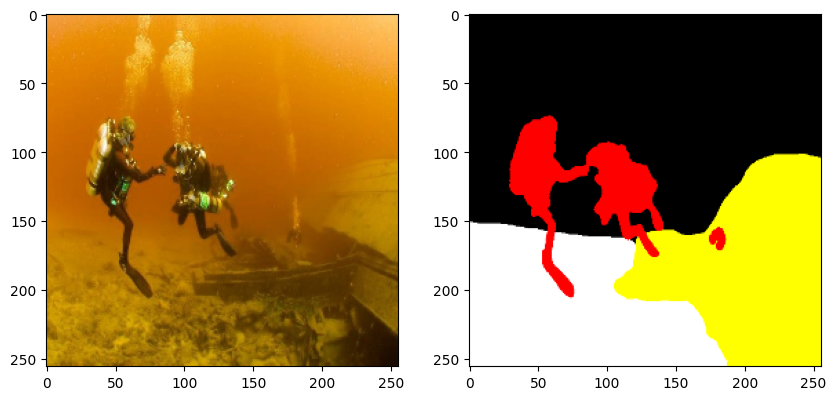

In [3]:
images, masks = load_data(image_dir, mask_dir)
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(images[0])
axs[1].imshow(masks[0])
plt.show()

In [4]:
import numpy as np
from PIL import Image
import os

# Define the color-to-class mapping
color_to_class = {
    (0, 0, 0): 0,         # Background (waterbody)
    (0, 0, 255): 1,       # Human divers
    (0, 255, 0): 2,       # Aquatic plants and sea-grass
    (0, 255, 255): 3,     # Wrecks and ruins
    (255, 0, 0): 4,       # Robots (AUVs/ROVs/instruments)
    (255, 0, 255): 5,     # Reefs and invertebrates
    (255, 255, 0): 6,     # Fish and vertebrates
    (255, 255, 255): 7    # Sea-floor and rocks
}

def mask_to_class(mask, color_to_class):
    mask_rgb = np.array(mask)  # Convert mask to a numpy array
    height, width, _ = mask_rgb.shape
    label_mask = np.zeros((height, width, 8), dtype=np.float32)  # Initialize the class label mask with 8 channels

    # Iterate over the color-to-class mapping and assign class ids
    for rgb, class_id in color_to_class.items():
        # Create a mask where the color matches the current RGB tuple
        match = np.all(mask_rgb == rgb, axis=-1)
        label_mask[:, :, class_id] = match.astype(np.float32)  # Assign 1 to the matching pixels in the corresponding channel

    # print(label_mask.shape)
    return label_mask

# Directory to save class masks
output_dir = "/class_masks"
os.makedirs(output_dir, exist_ok=True)
class_masks=[]
# Process all mask images
for i, mask_image in enumerate(masks):
    # Convert the RGB mask to a class index mask
    class_mask = mask_to_class(mask_image, color_to_class)
    class_masks.append(class_mask)

In [5]:
import os
import numpy as np
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(images, class_masks, test_size=0.2, random_state=42)

# Check the number of samples in each split
print(f"Training samples: {len(X_train)}, Testing samples: {len(X_test)}")

# Now you can use X_train and X_test for training and testing

Training samples: 1220, Testing samples: 305


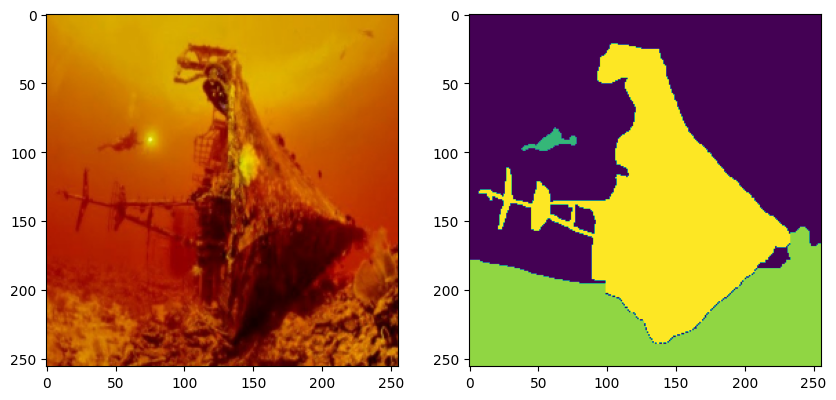

In [6]:
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(X_train[0])
axs[1].imshow(np.argmax(y_train[0],axis=2))
plt.show()

In [7]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

1220
1220
305
305


In [8]:
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    dice_coef = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return 1 - dice_coef

def bce_dice_loss(y_true, y_pred):
    # Binary Crossentropy
    bce_loss = tf.keras.losses.BinaryCrossentropy(from_logits=False)
    bce = bce_loss(y_true, y_pred)

    # Dice loss
    dice = dice_loss(y_true, y_pred)

    # Combine the losses
    combined_loss = 0.5 * bce + 0.5 * dice
    return combined_loss

In [9]:
from tensorflow.keras.layers import Dropout, BatchNormalization
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Input,Flatten, Dense,concatenate, Dropout, BatchNormalization, Activation, UpSampling2D,GlobalAveragePooling2D, Lambda
from tensorflow.keras.optimizers import Adam


from tensorflow.keras.layers import Conv2D, BatchNormalization, UpSampling2D, concatenate, Input, GlobalAveragePooling2D, Lambda
from tensorflow.keras.models import Model
import tensorflow as tf

from tensorflow.keras.layers import Conv2D, BatchNormalization, UpSampling2D, concatenate, Input, GlobalAveragePooling2D, Lambda
from tensorflow.keras.models import Model
import tensorflow as tf

# Simple Atrous Spatial Pyramid Pooling (ASPP) block
def simple_aspp_block(inputs):
    # Input shape without using tf.shape() to avoid error
    input_shape = inputs.shape  # Keras-compatible shape

    # Atrous convolutions with different rates (reduce filters for simplicity)
    conv1 = Conv2D(64, (1, 1), padding="same", activation="relu")(inputs)
    conv1 = BatchNormalization()(conv1)

    conv2 = Conv2D(64, (3, 3), padding="same", activation="relu", dilation_rate=6)(inputs)
    conv2 = BatchNormalization()(conv2)

    conv3 = Conv2D(64, (3, 3), padding="same", activation="relu", dilation_rate=12)(inputs)
    conv3 = BatchNormalization()(conv3)

    # Global Average Pooling
    pool = GlobalAveragePooling2D()(inputs)
    pool = Lambda(lambda x: tf.expand_dims(tf.expand_dims(x, 1), 1))(pool)  # Add spatial dimensions back
    pool = Conv2D(64, (1, 1), padding="same", activation="relu")(pool)
    pool = BatchNormalization()(pool)

    # Upsample to match the input shape using UpSampling2D (instead of tf.image.resize)
    pool = UpSampling2D(size=(input_shape[1], input_shape[2]))(pool)  # This matches the input height and width

    # Concatenate all ASPP branches
    output = concatenate([conv1, conv2, conv3, pool], axis=-1)

    # Final 1x1 convolution to combine the features
    output = Conv2D(64, (1, 1), padding="same", activation="relu")(output)
    output = BatchNormalization()(output)

    return output

# Simple DeepLabV3 model for small datasets
def build_simple_deeplabv3(input_shape, num_classes):
    inputs = Input(shape=input_shape)

    # Apply the simplified ASPP block directly to the input
    aspp = simple_aspp_block(inputs)

    # Upsample to the original input size
    output = UpSampling2D(size=(input_shape[0] // aspp.shape[1], input_shape[1] // aspp.shape[2]))(aspp)

    # Final output layer for segmentation
    output = Conv2D(num_classes, (1, 1), activation="softmax")(output)

    model = Model(inputs, output)

    return model

# Define input shape and number of classes
input_shape = (256, 256, 3)  # Example input shape (adjust as needed)
num_classes = 8  # Example number of segmentation classes

# Build the simplified DeepLabV3 model
simple_deeplab_model = build_simple_deeplabv3(input_shape, num_classes)

# Compile the model
simple_deeplab_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
simple_deeplab_model.summary()



Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 3)         │          0 │ input_layer[0][0] │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, 1, 1, 3)   │          0 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 1, 1, 64)  │        256 │ lambda[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        256 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1, 1, 64)  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (UpSampling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Concatenate)       │ 256)              │            │ batch_normalizat… │
│                     │                   │            │ batch_normalizat… │
│                     │                   │            │ up_sampling2d[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 256, 256,  │     16,448 │ concatenate[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (UpSampling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 256, 256,  │        520 │ up_sampling2d_1[

 Total params: 22,344 (87.28 KB)

 Trainable params: 21,704 (84.78 KB)

 Non-trainable params: 640 (2.50 KB)

In [10]:
y_train = np.array(y_train).reshape((1220, 256, 256, 8))

In [11]:
y_test =np.array(y_test).reshape((305, 256, 256, 8))

In [13]:
# Train the model
# print(X_train.shape,y_train.shape)
history = simple_deeplab_model.fit(X_train, y_train, epochs=100, batch_size=16, validation_data=(X_test, y_test))


Epoch 1/100


I0000 00:00:1729270976.244862      95 service.cc:145] XLA service 0x7cdb301098f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1729270976.244949      95 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


 2/77 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - accuracy: 0.1502 - loss: 2.3997  

I0000 00:00:1729270984.641454      95 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


77/77 ━━━━━━━━━━━━━━━━━━━━ 26s 182ms/step - accuracy: 0.4270 - loss: 1.6998 - val_accuracy: 0.4494 - val_loss: 1.7931
Epoch 2/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - accuracy: 0.5815 - loss: 1.2310 - val_accuracy: 0.5582 - val_loss: 1.3461
Epoch 3/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - accuracy: 0.5910 - loss: 1.1838 - val_accuracy: 0.5981 - val_loss: 1.1546
Epoch 4/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - accuracy: 0.6105 - loss: 1.1058 - val_accuracy: 0.6102 - val_loss: 1.1152
Epoch 5/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - accuracy: 0.6087 - loss: 1.0926 - val_accuracy: 0.6086 - val_loss: 1.1018
Epoch 6/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - accuracy: 0.6156 - loss: 1.0586 - val_accuracy: 0.6173 - val_loss: 1.0820
Epoch 7/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.6150 - loss: 1.0448 - val_accuracy: 0.6165 - val_loss: 1.0752
Epoch 8/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.6027 - loss: 1.0592 - val_accuracy: 0.6288 - val

10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 309ms/step - accuracy: 0.6140 - loss: 1.1397
Test Accuracy: 0.6060
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step


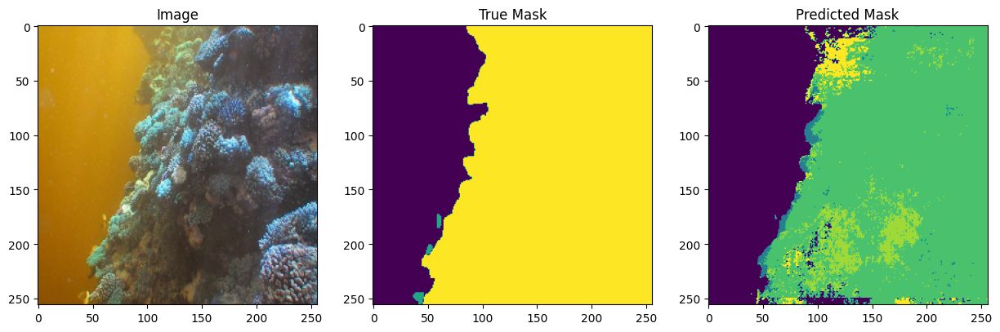

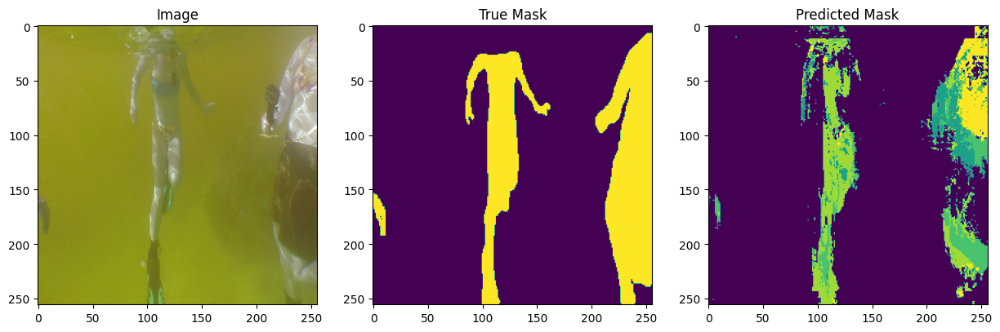

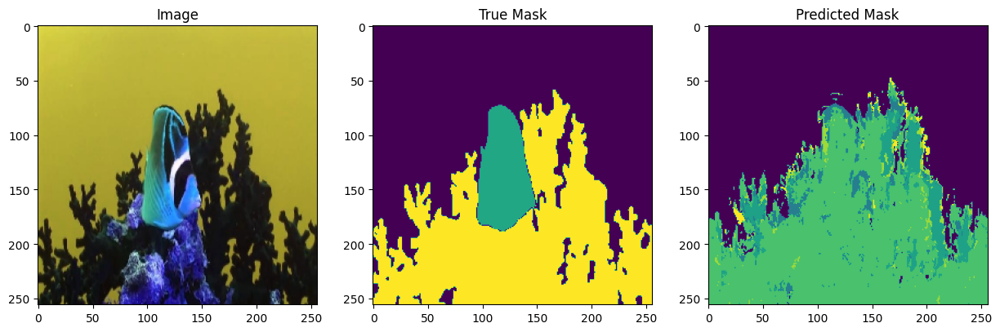

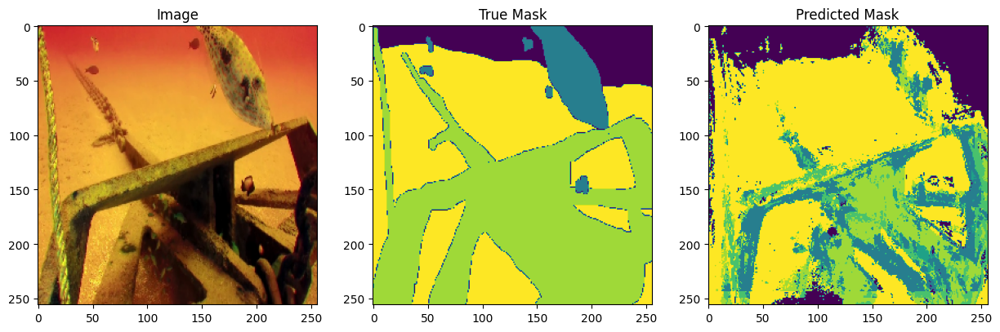

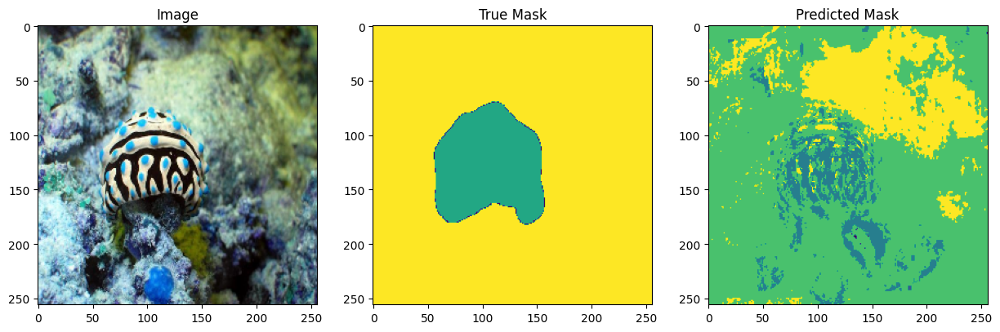

...

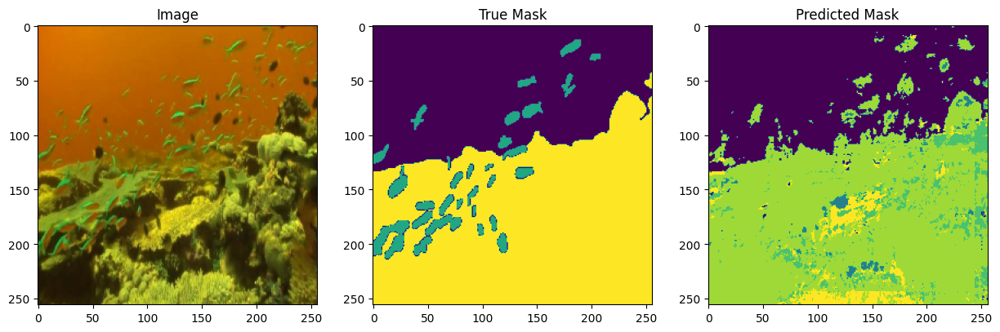

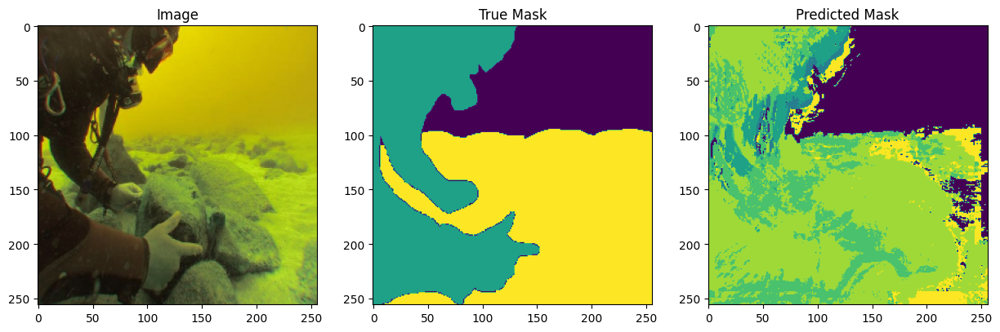

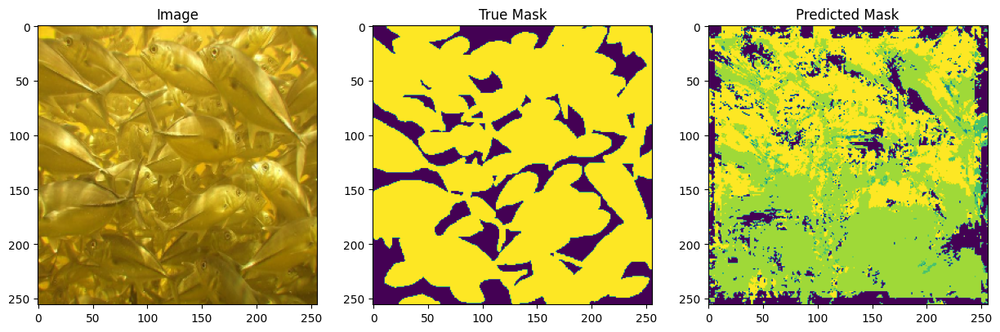

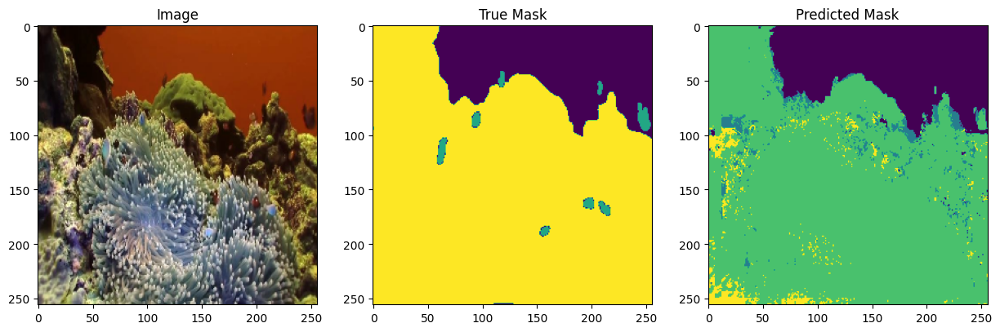

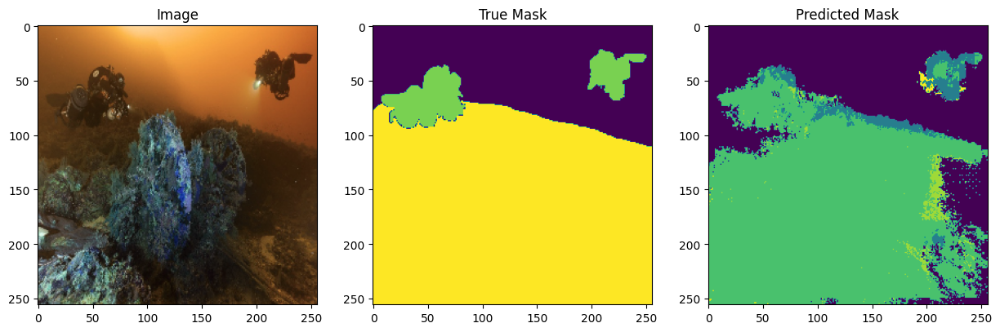

In [14]:
# Evaluate the model
loss, acc = simple_deeplab_model.evaluate(X_test, y_test)
print(f"Test Accuracy: {acc:.4f}")

# Predict the masks for the test set
y_pred = simple_deeplab_model.predict(X_test)

# Plotting function for results (image, true mask, and predicted mask)
def plot_sample(image, mask_true, mask_pred):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    
    axs[0].imshow(image)
    axs[0].set_title("Image")
    
    axs[1].imshow(np.argmax(mask_true, axis=2))
    axs[1].set_title("True Mask")
    
    axs[2].imshow(np.argmax(mask_pred, axis=2))
    axs[2].set_title("Predicted Mask")
    
    plt.show()


# Visualize the results
for i in range(50):
    sample_img = X_test[i]
    sample_true_mask = y_test[i]
    sample_pred_mask = y_pred[i]
    
    plot_sample(sample_img, sample_true_mask, sample_pred_mask)


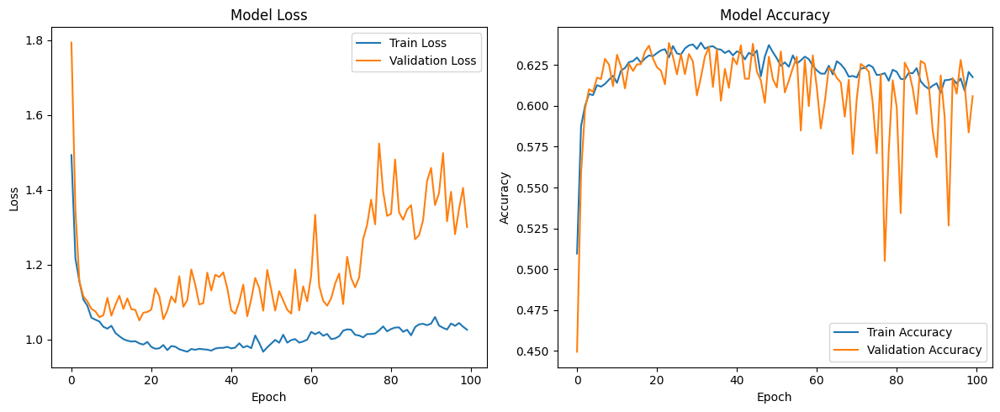

In [15]:
import matplotlib.pyplot as plt

def plot_loss_accuracy(history):
    # Plot training & validation loss values
    plt.figure(figsize=(12, 5))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')

    plt.tight_layout()
    plt.show()

# Example usage
# history = model.fit(...)  # Assuming you have trained the model and history is returned
plot_loss_accuracy(history)
